In [40]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


In [41]:

def rotate_image(img, angle):
    """
    Rotate image by given angle (counter-clockwise) around center
    """
    (h, w) = img.shape[:2]
    center = (w // 2, h // 2)
    
    
    # Get rotation matrix (positive angle = counter-clockwise)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Calculate new image size to prevent cropping
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))
    
    # Adjust rotation matrix for new size
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]
    
    # Perform rotation with white background
    rotated = cv2.warpAffine(img, M, (new_w, new_h), 
                             borderMode=cv2.BORDER_CONSTANT,
                             borderValue=(255, 255, 255))
    return rotated

In [42]:

def detect_and_visualize_text_lines(image_path):
    """
    Detect text lines using Hough Line Transform and visualize only the detected lines
    """
    # Read image
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not read image from {image_path}")
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Preprocessing
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150, apertureSize=3)
    
    # Detect lines using Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=80,
                            minLineLength=100, maxLineGap=10)
    
    # Store and categorize lines
    text_lines = []
    vertical_lines = []
    
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            if ((x1**2 + y1 **2 ) ** 0.5) > ((x2**2 + y2 **2 ) ** 0.5):
                x1, y1, x2, y2 = x2, y2, x1, y1
            
            # Calculate angle
            angle = np.degrees(np.arctan2(y2 - y1, x2 - x1))
            
            # Normalize to [-90, 90]
            if angle < -90:
                angle += 180
            elif angle > 90:
                angle -= 180
            
            length = np.sqrt((x2-x1)**2 + (y2-y1)**2)
            
            line_data = {
                'coords': (x1, y1, x2, y2),
                'angle': angle,
                'length': length
            }
            
            
            text_lines.append(line_data)
        
    
    # Sort text lines by Y coordinate (top to bottom)
    # text_lines.sort(key=lambda l: (l['coords'][1] + l['coords'][3]) / 2)
    all_angles = [i['angle'] for i in text_lines] 
    # Suppose arr is your array
    counts, bins = np.histogram(all_angles, bins=30)

    # Index of bin with the max count
    max_bin_index = np.argmax(counts)

    # Get bin range
    max_bin_start = bins[max_bin_index]
    max_bin_end = bins[max_bin_index + 1]
    text_lines = [i for i in text_lines if max_bin_start <= i['angle'] <= max_bin_end]
    
    angles = [l['angle'] for l in text_lines]
    median_angle = np.median(angles) 
    
    rotation_needed = median_angle 
    # rotate image if needed
    if abs(rotation_needed) > 0.1:
        img_rotate = rotate_image(img, rotation_needed)
        img_rgb = cv2.cvtColor(img_rotate, cv2.COLOR_BGR2RGB)  
        
    return rotation_needed, img_rgb

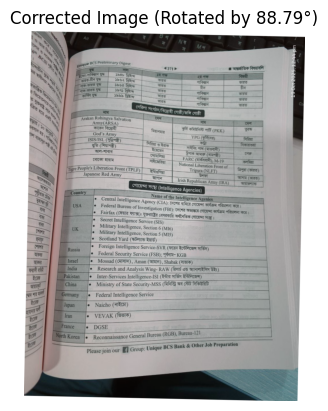

In [43]:
# Usage
image_path = '/mnt/storage1/workspace/arobin/bangla_printed_ocr/bangla_ocr/page_orientation/test_img/photo_6316441238265072548_y.jpg'

# Get corrected image
rotation_angle,corrected_img = detect_and_visualize_text_lines(image_path)
plt.imshow(cv2.cvtColor(corrected_img, cv2.COLOR_BGR2RGB))
plt.title(f'Corrected Image (Rotated by {rotation_angle:.2f}°)')
plt.axis('off')
plt.show()  

Image shape: (1299, 986, 3)
Running inference...
Saved result to: result.jpg

Detected 1 objects:
  - Class_0: 0.951 (225 boundary points)

Generating scatter plots...
Saved overlay plot to: scatter_overlay.png

Mask coordinates:
  Object 1: 225 points
    X range: [58.6, 949.7]
    Y range: [69.0, 1203.6]


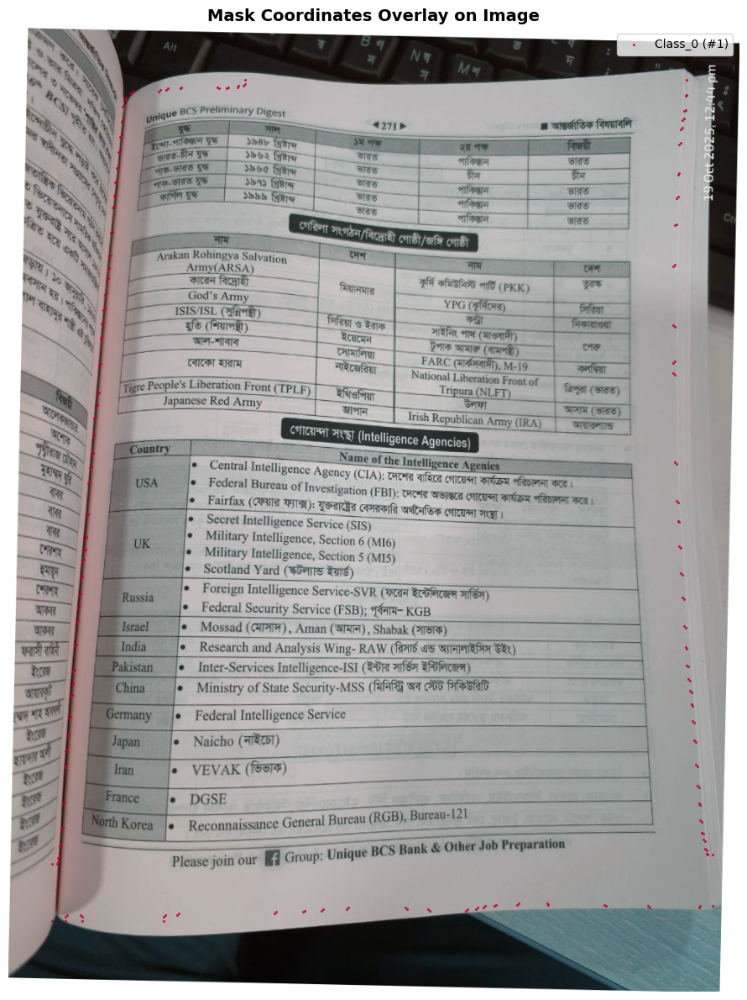

In [44]:
import cv2
import numpy as np
from ultralytics import YOLO
import os
from pathlib import Path
import random

class YOLOSegmentationInference:
    def __init__(self, model_path, class_names=None):
        """
        Initialize YOLO segmentation inference.
        
        Args:
            model_path: Path to trained YOLO model (.pt file)
            class_names: List of class names (optional)
        """
        self.model = YOLO(model_path)
        self.class_names = class_names or [f"Class_{i}" for i in range(len(self.model.names))]
        
        # Generate random colors for each class
        random.seed(42)
        self.colors = [
            (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            for _ in range(len(self.class_names))
        ]
    
    def predict_image(self, image, conf_threshold=0.25, iou_threshold=0.7):
        """
        Run inference on a single image.
        
        Args:
            image: Input image (numpy array or path string)
            conf_threshold: Confidence threshold for detections
            iou_threshold: IoU threshold for NMS
            
        Returns:
            results: YOLO results object
        """
        results = self.model.predict(
            source=image,
            conf=conf_threshold,
            iou=iou_threshold,
            save=False,
            verbose=False
        )
        return results[0]
    
    def visualize_results(self, image, results, show_boxes=True, 
                         show_labels=True, show_conf=True, mask_alpha=0.4):
        """
        Visualize segmentation results on image.
        
        Args:
            image: Input image (numpy array or path string)
            results: YOLO results object
            show_boxes: Whether to show bounding boxes
            show_labels: Whether to show class labels
            show_conf: Whether to show confidence scores
            mask_alpha: Transparency of segmentation masks (0-1)
            
        Returns:
            annotated_image: Image with annotations (RGB numpy array)
        """
        # Handle both numpy array and path input
        if isinstance(image, (str, Path)):
            image = cv2.imread(str(image))
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        else:
            # Assume it's already a numpy array
            image = np.array(image)
            # Handle BGR to RGB if needed (check if it's BGR)
            if len(image.shape) == 3 and image.shape[2] == 3:
                # Assume input is RGB, copy it
                image = image.copy()
        
        annotated_image = image.copy()
        
        # Check if there are any detections
        if results.masks is None or len(results.masks) == 0:
            return annotated_image
        
        # Get masks and boxes
        masks = results.masks.data.cpu().numpy()
        boxes = results.boxes.xyxy.cpu().numpy()
        classes = results.boxes.cls.cpu().numpy().astype(int)
        confidences = results.boxes.conf.cpu().numpy()
        
        # Create overlay for masks
        overlay = image.copy()
        
        # Draw each detection
        for i, (mask, box, cls, conf) in enumerate(zip(masks, boxes, classes, confidences)):
            # Resize mask to image size
            mask_resized = cv2.resize(mask, (image.shape[1], image.shape[0]))
            mask_binary = (mask_resized > 0.5).astype(np.uint8)
            
            # Get color for this class
            color = self.colors[cls]
            
            # Apply colored mask
            colored_mask = np.zeros_like(image)
            colored_mask[mask_binary == 1] = color
            overlay = cv2.addWeighted(overlay, 1, colored_mask, mask_alpha, 0)
            
            # Draw contours around mask
            contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(overlay, contours, -1, color, 2)
            
            if show_boxes:
                # Draw bounding box
                x1, y1, x2, y2 = box.astype(int)
                cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 2)
                
                if show_labels:
                    # Prepare label text
                    label = self.class_names[cls]
                    if show_conf:
                        label = f"{label} {conf:.2f}"
                    
                    # Draw label background
                    (label_w, label_h), _ = cv2.getTextSize(
                        label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2
                    )
                    cv2.rectangle(
                        overlay, 
                        (x1, y1 - label_h - 10), 
                        (x1 + label_w + 10, y1), 
                        color, 
                        -1
                    )
                    
                    # Draw label text
                    cv2.putText(
                        overlay, 
                        label, 
                        (x1 + 5, y1 - 5), 
                        cv2.FONT_HERSHEY_SIMPLEX, 
                        0.6, 
                        (255, 255, 255), 
                        2
                    )
        
        # Blend overlay with original image
        annotated_image = cv2.addWeighted(image, 1 - mask_alpha, overlay, mask_alpha, 0)
        
        return annotated_image
    
    def save_result(self, annotated_image, output_path):
        """Save annotated image to file."""
        annotated_image_bgr = cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(str(output_path), annotated_image_bgr)
        print(f"Saved result to: {output_path}")
    
    def plot_mask_coordinates(self, results, image_shape=None, save_path=None):
        """
        Plot segmentation mask coordinates in scatter form.
        
        Args:
            results: YOLO results object
            image_shape: Tuple of (height, width) for proper axis scaling
            save_path: Optional path to save the plot
        """
        import matplotlib.pyplot as plt
        
        if results.masks is None or len(results.masks) == 0:
            print("No masks found in results")
            return
        
        # Get mask coordinates
        masks_xy = results.masks.xy  # List of polygons
        classes = results.boxes.cls.cpu().numpy().astype(int)
        
        # Create figure
        fig, ax = plt.subplots(figsize=(12, 10))
        
        # Plot each mask
        for i, (mask_coords, cls) in enumerate(zip(masks_xy, classes)):
            if len(mask_coords) > 0:
                x_coords = mask_coords[:, 0]
                y_coords = mask_coords[:, 1]
                
                # Get color for this class
                color_rgb = tuple(c/255.0 for c in self.colors[cls])
                
                # Plot scatter
                ax.scatter(x_coords, y_coords, 
                          c=[color_rgb], 
                          s=2, 
                          alpha=0.6,
                          label=f"{self.class_names[cls]} (#{i+1})")
        
        # Set labels and title
        ax.set_xlabel('X coordinate (pixels)', fontsize=12)
        ax.set_ylabel('Y coordinate (pixels)', fontsize=12)
        ax.set_title('Segmentation Mask Coordinates (Scatter Plot)', fontsize=14, fontweight='bold')
        
        # Invert y-axis to match image coordinates
        ax.invert_yaxis()
        
        # Set aspect ratio
        ax.set_aspect('equal')
        
        # Add grid
        ax.grid(True, alpha=0.3)
        
        # Add legend
        ax.legend(loc='best', fontsize=10)
        
        # Set axis limits if image shape provided
        if image_shape is not None:
            height, width = image_shape[:2]
            ax.set_xlim(0, width)
            ax.set_ylim(height, 0)
        
        plt.tight_layout()
        
        # Save or show
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"Saved scatter plot to: {save_path}")
        else:
            plt.show()
        
        return fig, ax
    
    def plot_mask_coordinates_overlay(self, image, results, save_path=None):
        """
        Plot mask coordinates as scatter points overlaid on the original image.
        
        Args:
            image: Original image (numpy array or path)
            results: YOLO results object
            save_path: Optional path to save the plot
        """
        import matplotlib.pyplot as plt
        
        # Handle image input
        if isinstance(image, (str, Path)):
            img = cv2.imread(str(image))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img = np.array(image)
        
        if results.masks is None or len(results.masks) == 0:
            print("No masks found in results")
            return
        
        # Get mask coordinates
        masks_xy = results.masks.xy
        classes = results.boxes.cls.cpu().numpy().astype(int)
        
        # Create figure
        fig, ax = plt.subplots(figsize=(14, 12))
        
        # Show image
        ax.imshow(img)
        
        # Plot each mask
        for i, (mask_coords, cls) in enumerate(zip(masks_xy, classes)):
            if len(mask_coords) > 0:
                x_coords = mask_coords[:, 0]
                y_coords = mask_coords[:, 1]
                
                # Get color for this class
                color_rgb = tuple(c/255.0 for c in self.colors[cls])
                
                # Plot scatter
                ax.scatter(x_coords, y_coords, 
                          c=[color_rgb], 
                          s=3, 
                          alpha=0.8,
                          edgecolors='red',
                          linewidths=0.5,
                          label=f"{self.class_names[cls]} (#{i+1})")
        
        ax.set_xlabel('X coordinate (pixels)', fontsize=12)
        ax.set_ylabel('Y coordinate (pixels)', fontsize=12)
        ax.set_title('Mask Coordinates Overlay on Image', fontsize=14, fontweight='bold')
        ax.legend(loc='best', fontsize=10)
        ax.axis('off')
        
        plt.tight_layout()
        
        # Save or show
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"Saved overlay plot to: {save_path}")
        else:
            plt.show()
        
        return fig, ax
    
    def process_folder(self, input_folder, output_folder, conf_threshold=0.25, 
                      iou_threshold=0.7, mask_alpha=0.4):
        """
        Process all images in a folder.
        
        Args:
            input_folder: Path to folder containing images
            output_folder: Path to save annotated images
            conf_threshold: Confidence threshold
            iou_threshold: IoU threshold
            mask_alpha: Mask transparency
        """
        input_path = Path(input_folder)
        output_path = Path(output_folder)
        output_path.mkdir(parents=True, exist_ok=True)
        
        # Supported image formats
        image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp']
        
        # Get all images
        image_files = [
            f for f in input_path.iterdir() 
            if f.suffix.lower() in image_extensions
        ]
        
        print(f"Found {len(image_files)} images")
        
        for idx, img_path in enumerate(image_files, 1):
            print(f"Processing {idx}/{len(image_files)}: {img_path.name}")
            
            # Run inference
            results = self.predict_image(img_path, conf_threshold, iou_threshold)
            
            # Visualize
            annotated = self.visualize_results(img_path, results, mask_alpha=mask_alpha)
            
            # Save
            output_file = output_path / f"annotated_{img_path.name}"
            self.save_result(annotated, output_file)
            
            # Print detection info
            if results.masks is not None and len(results.masks) > 0:
                n_detections = len(results.masks)
                classes_detected = results.boxes.cls.cpu().numpy().astype(int)
                class_counts = {cls: list(classes_detected).count(cls) for cls in set(classes_detected)}
                print(f"  Detections: {n_detections} objects - {class_counts}")
            else:
                print(f"  No detections")
        
        print(f"\nProcessing complete! Results saved to: {output_folder}")


def main():
    """Example usage for numpy array image with scatter plots"""
    
    # Configuration
    MODEL_PATH = "/mnt/storage1/workspace/arobin/bangla_printed_ocr/bangla_ocr/page_orientation/up_down/runs/train_seg_updown/weights/best.pt"  # Path to your trained model
    
    # Class names (update with your actual class names)
    CLASS_NAMES = ["Class_0", "Class_1"]  # Update this!
    
    # Initialize inference
    inference = YOLOSegmentationInference(
        model_path=MODEL_PATH,
        class_names=CLASS_NAMES
    )
    
    # Example: Load image and convert to numpy array
    #image_path = "path/to/test/image.jpg"
    image_np = corrected_img
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)  # Convert to RGB
    
    print(f"Image shape: {image_np.shape}")
    print("Running inference...")
    
    # Run inference on numpy array
    results = inference.predict_image(image_np, conf_threshold=0.25)
    
    # Visualize results with masks
    annotated = inference.visualize_results(image_np, results, mask_alpha=0.4)
    inference.save_result(annotated, "result.jpg")
    
    # Print detection info
    if results.masks is not None and len(results.masks) > 0:
        n_detections = len(results.masks)
        classes_detected = results.boxes.cls.cpu().numpy().astype(int)
        confidences = results.boxes.conf.cpu().numpy()
        print(f"\nDetected {n_detections} objects:")
        for i, (cls, conf) in enumerate(zip(classes_detected, confidences)):
            mask_coords = results.masks.xy[i]
            print(f"  - {CLASS_NAMES[cls]}: {conf:.3f} ({len(mask_coords)} boundary points)")
        
        # Plot mask coordinates in scatter form
        print("\nGenerating scatter plots...")
        
        # # Option 1: Scatter plot only (no image background)
        # inference.plot_mask_coordinates(
        #     results, 
        #     image_shape=image_np.shape,
        #     save_path="scatter_plot.png"
        # )
        
        # Option 2: Scatter plot overlaid on image
        inference.plot_mask_coordinates_overlay(
            image_np, 
            results,
            save_path="scatter_overlay.png"
        )
        
        # Extract coordinates for each mask (if you need them)
        print("\nMask coordinates:")
        for i, mask_coords in enumerate(results.masks.xy):
            print(f"  Object {i+1}: {len(mask_coords)} points")
            print(f"    X range: [{mask_coords[:, 0].min():.1f}, {mask_coords[:, 0].max():.1f}]")
            print(f"    Y range: [{mask_coords[:, 1].min():.1f}, {mask_coords[:, 1].max():.1f}]")
            
    else:
        print("No detections found")
    
    return annotated, results


if __name__ == "__main__":
    annotated_image, results = main()
    
    # You can also manually access and plot coordinates like this:
    # import matplotlib.pyplot as plt
    # for i, mask_coords in enumerate(results.masks.xy):
    #     plt.scatter(mask_coords[:, 0], mask_coords[:, 1], s=1, alpha=0.5)
    # plt.gca().invert_yaxis()
    # plt.show()

Testing different corner detection methods:

Method 1 - Convex Hull Extreme Points:
[[      158.1      93.366]
 [     915.17      69.009]
 [     949.68      1183.3]
 [     58.647      1203.6]]


Saved visualization to: corners_method1.png

Method 2 - Minimum Area Rectangle:
[[     30.148      76.298]
 [     922.87      53.729]
 [     951.46      1184.8]
 [     58.743      1207.4]]
Saved visualization to: corners_method2.png

Method 3 - Polygon Approximation:
[[     164.19      87.277]
 [     915.17      69.009]
 [     949.68      1183.3]
 [     58.647      1203.6]]
Saved visualization to: corners_method3.png

Method 4 - K-means Clustering:
[[     165.63      268.25]
 [     904.01       320.4]
 [     843.61      1034.6]
 [     141.14      990.56]]
Saved visualization to: corners_method4.png

Comparing all methods:

Method 1: Convex Hull Extreme
  Found corners:
    Corner 1: (158.1, 93.4)
    Corner 2: (915.2, 69.0)
    Corner 3: (949.7, 1183.3)
    Corner 4: (58.6, 1203.6)
Saved visualization to: comparison_method_1.png

Method 2: Min Area Rectangle
  Found corners:
    Corner 1: (30.1, 76.3)
    Corner 2: (922.9, 53.7)
    Corner 3: (951.5, 1184.8)
    Corner 4: (58.7, 1207.4

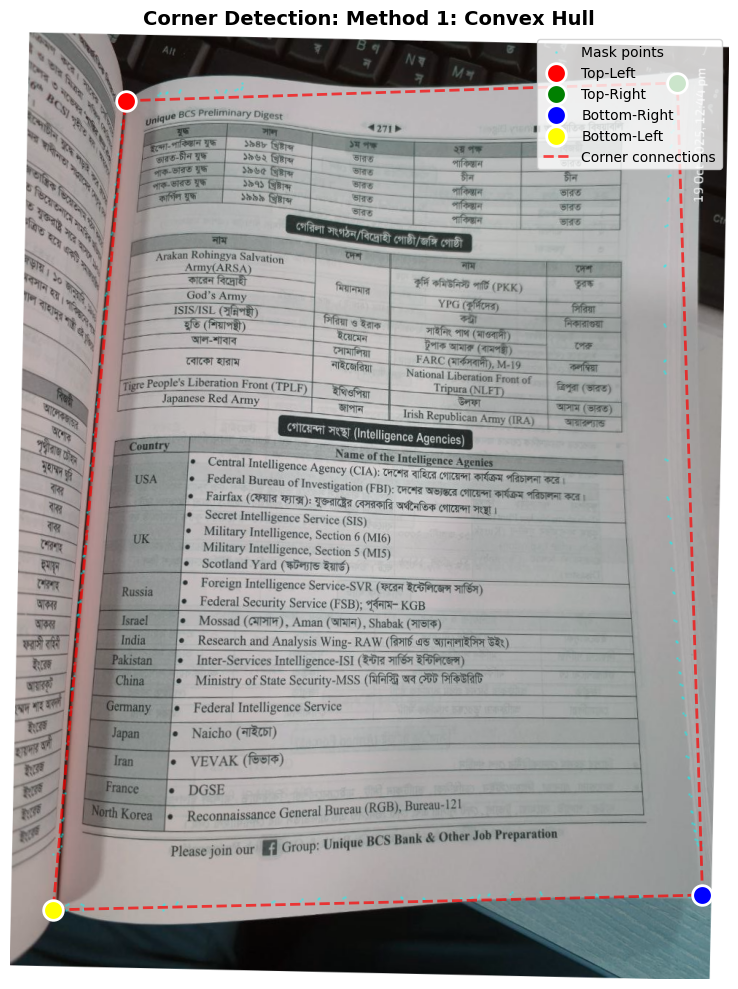

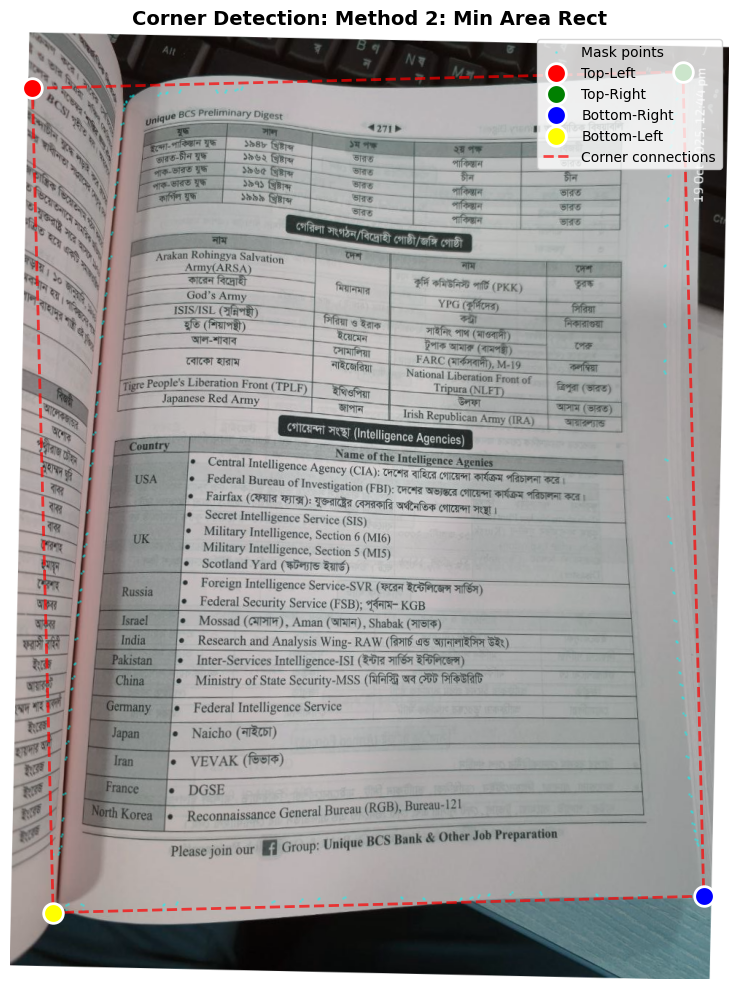

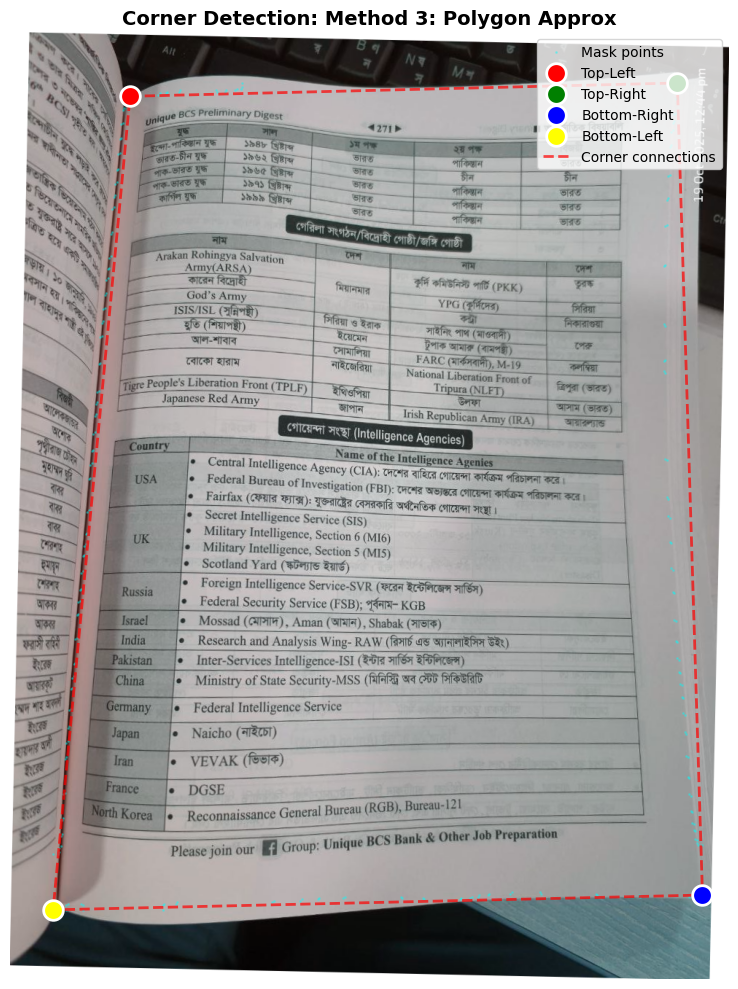

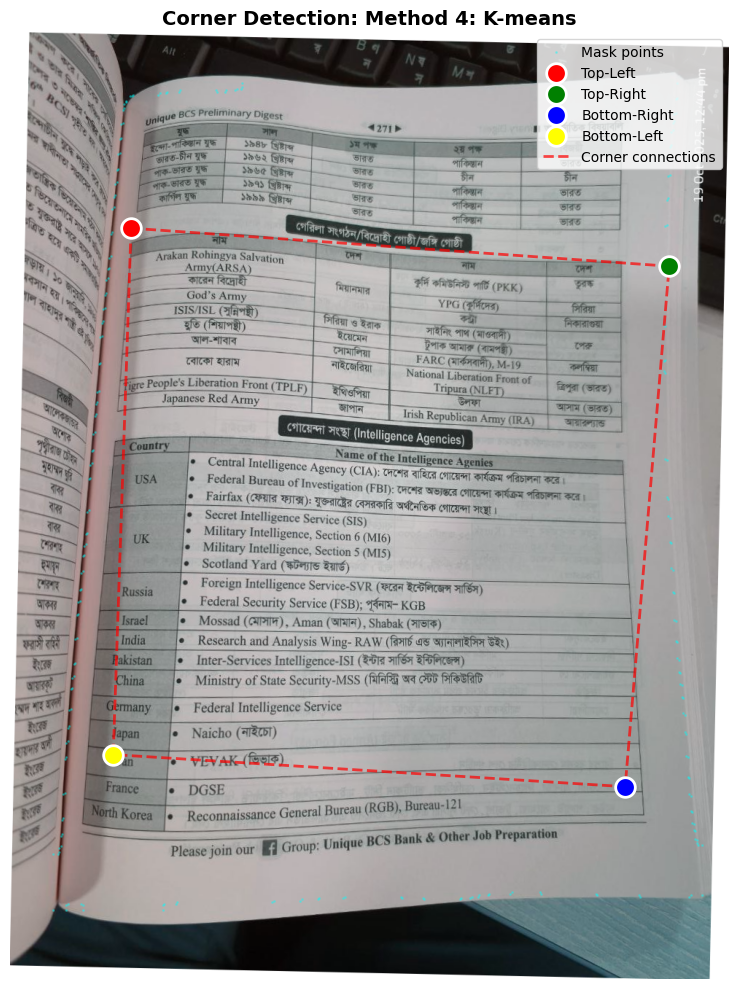

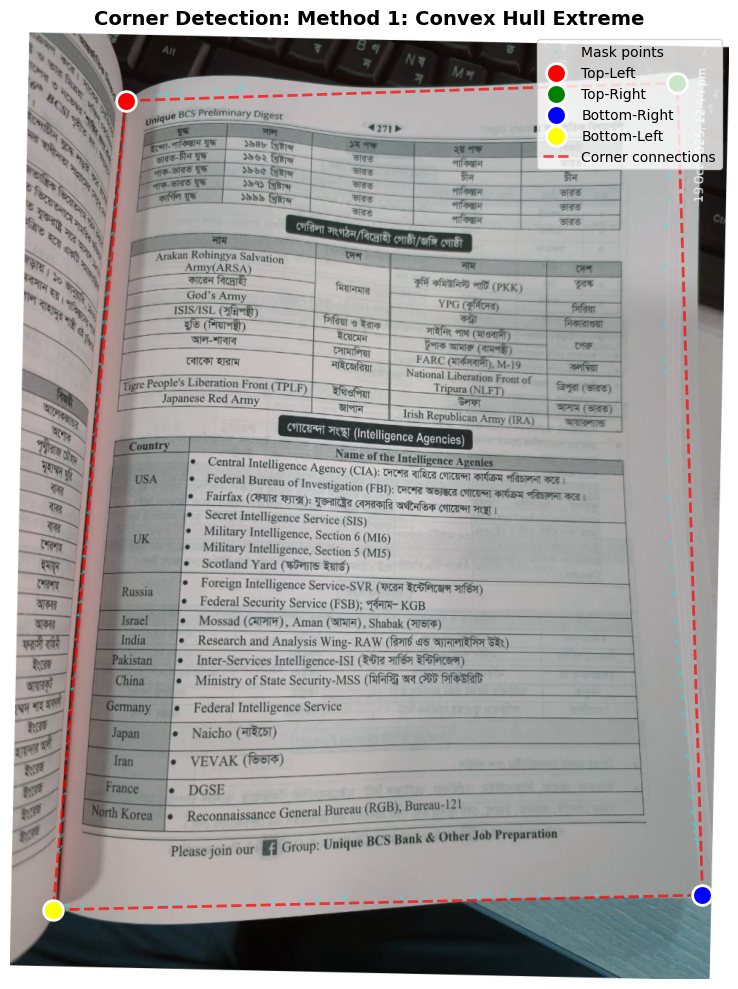

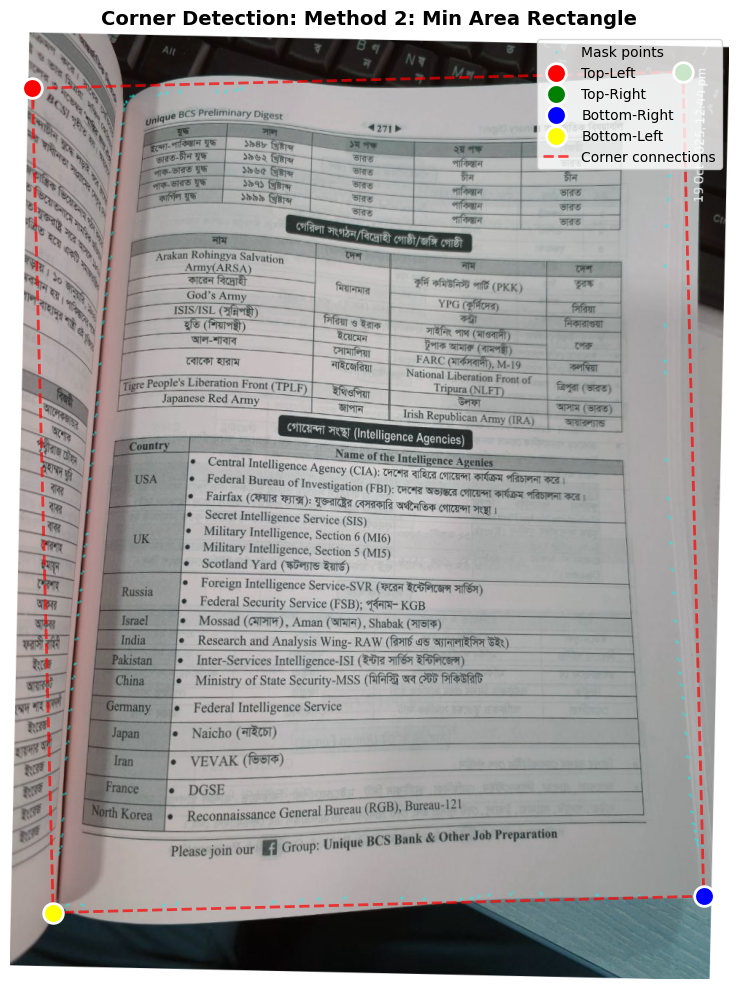

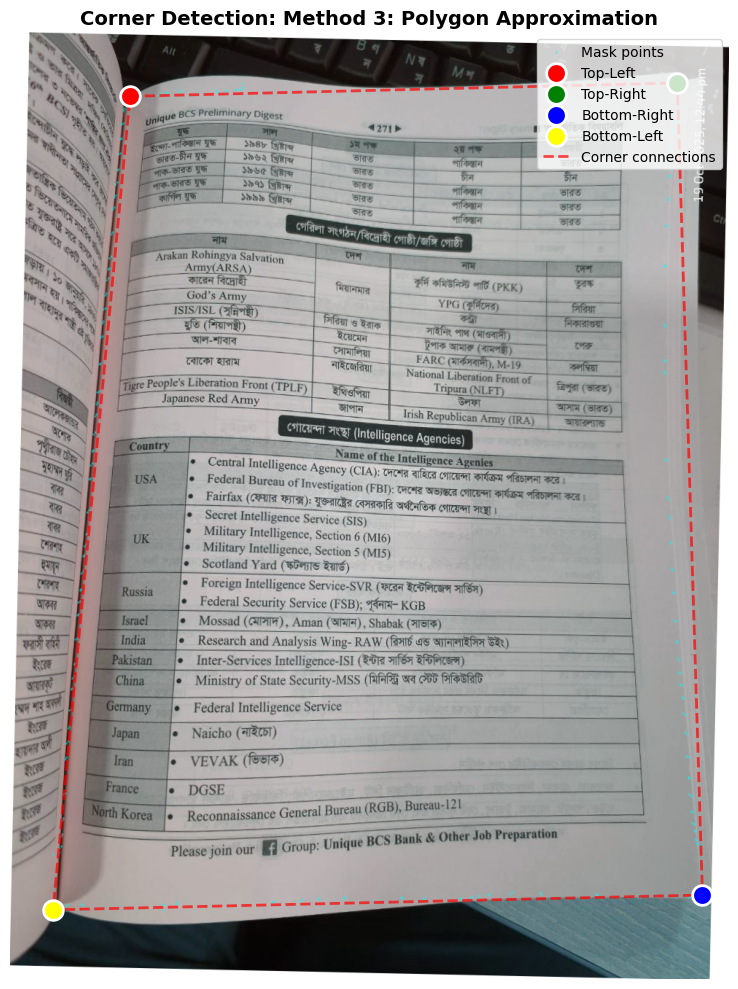

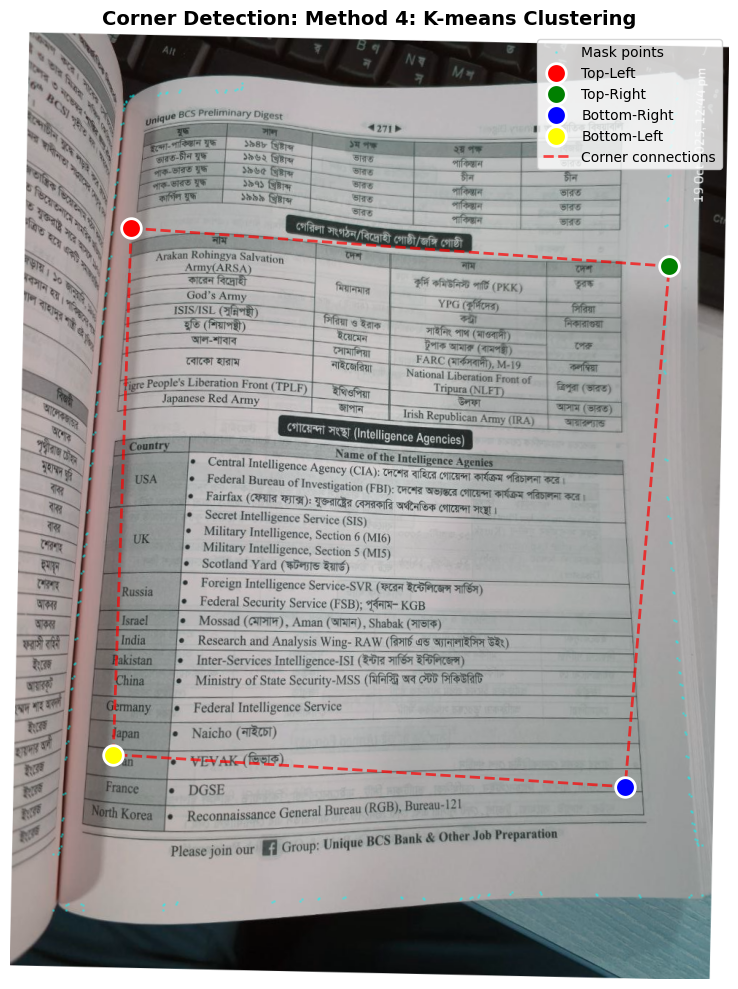

In [45]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial import distance


class CornerPointFinder:
    """Find 4 corner points from segmentation mask coordinates."""
    
    @staticmethod
    def method1_convex_hull_extreme(mask_coords):
        """
        Method 1: Find extreme points from convex hull.
        Works well for rectangular or quadrilateral shapes.
        
        Args:
            mask_coords: Numpy array of shape (N, 2) with [x, y] coordinates
            
        Returns:
            corners: Numpy array of shape (4, 2) with corner coordinates
                    Order: [top-left, top-right, bottom-right, bottom-left]
        """
        if len(mask_coords) < 4:
            return None
        
        # Compute convex hull
        hull = cv2.convexHull(mask_coords.astype(np.float32))
        hull = hull.reshape(-1, 2)
        
        # Find extreme points
        top_left = hull[np.argmin(hull[:, 0] + hull[:, 1])]  # Min x+y
        top_right = hull[np.argmin(hull[:, 1] - hull[:, 0])]  # Min y-x
        bottom_right = hull[np.argmax(hull[:, 0] + hull[:, 1])]  # Max x+y
        bottom_left = hull[np.argmax(hull[:, 1] - hull[:, 0])]  # Max y-x
        
        corners = np.array([top_left, top_right, bottom_right, bottom_left])
        return corners
    
    @staticmethod
    def method2_bounding_rect(mask_coords):
        """
        Method 2: Minimum area rotated rectangle corners.
        Works well for rotated rectangles.
        
        Args:
            mask_coords: Numpy array of shape (N, 2) with [x, y] coordinates
            
        Returns:
            corners: Numpy array of shape (4, 2) with corner coordinates
        """
        if len(mask_coords) < 4:
            return None
        
        # Find minimum area rectangle
        rect = cv2.minAreaRect(mask_coords.astype(np.float32))
        box = cv2.boxPoints(rect)
        
        # Sort corners: top-left, top-right, bottom-right, bottom-left
        corners = CornerPointFinder._order_corners(box)
        return corners
    
    @staticmethod
    def method3_polygon_approximation(mask_coords, epsilon_factor=0.02):
        """
        Method 3: Polygon approximation to reduce to 4 points.
        Uses Douglas-Peucker algorithm.
        
        Args:
            mask_coords: Numpy array of shape (N, 2) with [x, y] coordinates
            epsilon_factor: Approximation accuracy factor (0.01-0.05 typical)
            
        Returns:
            corners: Numpy array of shape (4, 2) with corner coordinates
        """
        if len(mask_coords) < 4:
            return None
        
        # Calculate epsilon as a percentage of the perimeter
        perimeter = cv2.arcLength(mask_coords.astype(np.float32), True)
        epsilon = epsilon_factor * perimeter
        
        # Approximate polygon
        approx = cv2.approxPolyDP(mask_coords.astype(np.float32), epsilon, True)
        approx = approx.reshape(-1, 2)
        
        # If we get exactly 4 points, return them
        if len(approx) == 4:
            corners = CornerPointFinder._order_corners(approx)
            return corners
        
        # If more than 4, use method 2 as fallback
        elif len(approx) > 4:
            return CornerPointFinder.method2_bounding_rect(mask_coords)
        
        # If less than 4, return None
        else:
            return None
    
    @staticmethod
    def method4_kmeans_clustering(mask_coords, n_points=100):
        """
        Method 4: K-means clustering to find 4 representative corners.
        Works well for complex shapes.
        
        Args:
            mask_coords: Numpy array of shape (N, 2) with [x, y] coordinates
            n_points: Number of points to sample for clustering
            
        Returns:
            corners: Numpy array of shape (4, 2) with corner coordinates
        """
        if len(mask_coords) < 4:
            return None
        
        # Sample points if too many
        if len(mask_coords) > n_points:
            indices = np.linspace(0, len(mask_coords)-1, n_points, dtype=int)
            sampled = mask_coords[indices]
        else:
            sampled = mask_coords
        
        # Perform K-means clustering
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
        _, _, centers = cv2.kmeans(
            sampled.astype(np.float32), 
            4, 
            None, 
            criteria, 
            10, 
            cv2.KMEANS_PP_CENTERS
        )
        
        # Order corners
        corners = CornerPointFinder._order_corners(centers)
        return corners
    
    @staticmethod
    def _order_corners(corners):
        """
        Order corners in clockwise order starting from top-left.
        Order: [top-left, top-right, bottom-right, bottom-left]
        
        Args:
            corners: Numpy array of shape (4, 2)
            
        Returns:
            ordered_corners: Numpy array of shape (4, 2)
        """
        # Calculate centroid
        centroid = np.mean(corners, axis=0)
        
        # Calculate angles from centroid
        angles = np.arctan2(corners[:, 1] - centroid[1], 
                           corners[:, 0] - centroid[0])
        
        # Sort by angle
        sorted_indices = np.argsort(angles)
        sorted_corners = corners[sorted_indices]
        
        # Find top-left (minimum y+x)
        top_idx = np.argmin(sorted_corners[:, 0] + sorted_corners[:, 1])
        
        # Rotate array so top-left is first
        ordered_corners = np.roll(sorted_corners, -top_idx, axis=0)
        
        return ordered_corners
    
    @staticmethod
    def visualize_corners(image, mask_coords, corners, method_name="", 
                         save_path=None, show_mask=True):
        """
        Visualize the found corner points on the image.
        
        Args:
            image: Original image (numpy array)
            mask_coords: Original mask coordinates
            corners: Found corner points (4, 2)
            method_name: Name of the method used
            save_path: Path to save the visualization
            show_mask: Whether to show all mask points
        """
        fig, ax = plt.subplots(figsize=(12, 10))
        
        # Display image
        ax.imshow(image)
        
        # Plot mask coordinates
        if show_mask:
            ax.scatter(mask_coords[:, 0], mask_coords[:, 1], 
                      c='cyan', s=1, alpha=0.3, label='Mask points')
        
        # Plot corner points
        if corners is not None:
            corner_labels = ['Top-Left', 'Top-Right', 'Bottom-Right', 'Bottom-Left']
            colors = ['red', 'green', 'blue', 'yellow']
            
            for i, (corner, label, color) in enumerate(zip(corners, corner_labels, colors)):
                ax.scatter(corner[0], corner[1], c=color, s=200, 
                          marker='o', edgecolors='white', linewidths=2,
                          label=f'{label}', zorder=5)
                ax.annotate(f'{i+1}', (corner[0], corner[1]), 
                           fontsize=12, color='white', weight='bold',
                           ha='center', va='center')
            
            # Draw lines connecting corners
            corners_closed = np.vstack([corners, corners[0]])
            ax.plot(corners_closed[:, 0], corners_closed[:, 1], 
                   'r--', linewidth=2, alpha=0.7, label='Corner connections')
        
        ax.set_title(f'Corner Detection: {method_name}', fontsize=14, fontweight='bold')
        ax.legend(loc='upper right', fontsize=10)
        ax.axis('off')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"Saved visualization to: {save_path}")
        else:
            plt.show()
        
        return fig, ax


def compare_all_methods(image, mask_coords, save_prefix="corner_method"):
    """
    Compare all corner detection methods.
    
    Args:
        image: Original image
        mask_coords: Mask coordinates
        save_prefix: Prefix for saved files
    """
    finder = CornerPointFinder()
    
    methods = [
        ("Method 1: Convex Hull Extreme", finder.method1_convex_hull_extreme),
        ("Method 2: Min Area Rectangle", finder.method2_bounding_rect),
        ("Method 3: Polygon Approximation", finder.method3_polygon_approximation),
        ("Method 4: K-means Clustering", finder.method4_kmeans_clustering),
    ]
    
    results = {}
    
    for method_name, method_func in methods:
        print(f"\n{method_name}")
        corners = method_func(mask_coords)
        
        if corners is not None:
            print(f"  Found corners:")
            for i, corner in enumerate(corners):
                print(f"    Corner {i+1}: ({corner[0]:.1f}, {corner[1]:.1f})")
            
            # Visualize
            save_path = f"{save_prefix}_{method_name.split(':')[0].replace(' ', '_').lower()}.png"
            finder.visualize_corners(image, mask_coords, corners, 
                                    method_name, save_path)
            
            results[method_name] = corners
        else:
            print(f"  Failed to find 4 corners")
            results[method_name] = None
    
    return results


# Example usage
if __name__ == "__main__":
    # Assume you have results from YOLO inference
    # results = model.predict(image)
    # mask_coords = results.masks.xy[0]  # First detected object
    
    # Example: Create dummy data for demonstration
    # Replace this with your actual mask coordinates
    import cv2
    
    # Load your image
    image = corrected_img
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Get mask coordinates from YOLO results
    # mask_coords should be numpy array of shape (N, 2)
    # Example: 
    mask_coords = results.masks.xy[0]
    
    
    # Find corners using different methods
    finder = CornerPointFinder()
    
    # Try different methods
    print("Testing different corner detection methods:\n")
    
    # Method 1
    corners1 = finder.method1_convex_hull_extreme(mask_coords)
    print("Method 1 - Convex Hull Extreme Points:")
    print(corners1)
    finder.visualize_corners(image, mask_coords, corners1, 
                            "Method 1: Convex Hull", "corners_method1.png")
    
    # Method 2
    corners2 = finder.method2_bounding_rect(mask_coords)
    print("\nMethod 2 - Minimum Area Rectangle:")
    print(corners2)
    finder.visualize_corners(image, mask_coords, corners2, 
                            "Method 2: Min Area Rect", "corners_method2.png")
    
    # Method 3
    corners3 = finder.method3_polygon_approximation(mask_coords)
    print("\nMethod 3 - Polygon Approximation:")
    print(corners3)
    finder.visualize_corners(image, mask_coords, corners3, 
                            "Method 3: Polygon Approx", "corners_method3.png")
    
    # Method 4
    corners4 = finder.method4_kmeans_clustering(mask_coords)
    print("\nMethod 4 - K-means Clustering:")
    print(corners4)
    finder.visualize_corners(image, mask_coords, corners4, 
                            "Method 4: K-means", "corners_method4.png")
    
    # Compare all methods
    print("\n" + "="*50)
    print("Comparing all methods:")
    print("="*50)
    all_results = compare_all_methods(image, mask_coords, "comparison")


PERSPECTIVE CORRECTION

Ordered Corner Points (TL, TR, BR, BL):
  Top-Left    : (158.1, 93.4)
  Top-Right   : (915.2, 69.0)
  Bottom-Right: (949.7, 1183.3)
  Bottom-Left : (58.6, 1203.6)

Original image size: 986 x 1299
Corrected image size: 891 x 1114



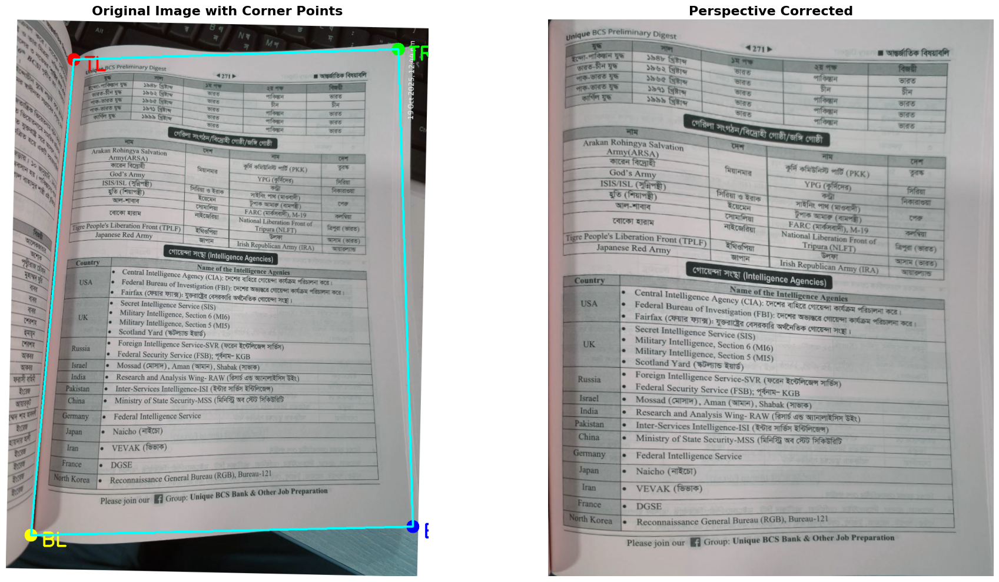

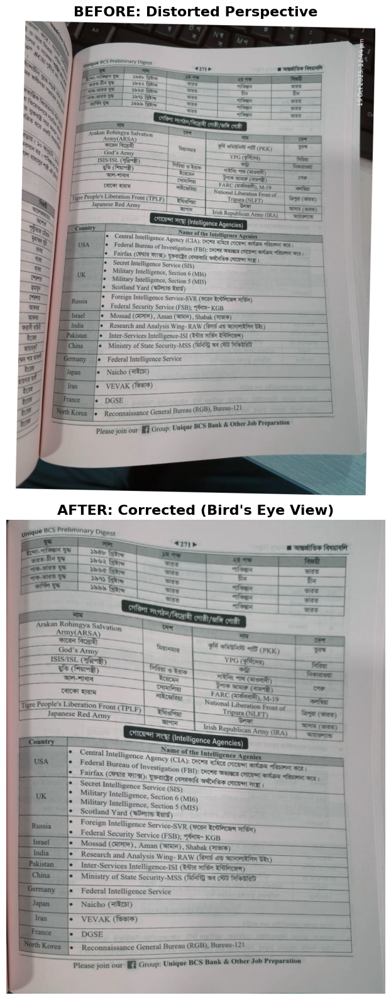

✓ Corrected image saved as 'corrected_page.jpg'


In [47]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def order_points(pts):
    """
    Order points in the order: top-left, top-right, bottom-right, bottom-left
    """
    # Initialize array to hold ordered coordinates
    rect = np.zeros((4, 2), dtype="float32")
    
    # Sum and difference to find corners
    s = pts.sum(axis=1)
    diff = np.diff(pts, axis=1)
    
    # Top-left will have smallest sum
    rect[0] = pts[np.argmin(s)]
    # Bottom-right will have largest sum
    rect[2] = pts[np.argmax(s)]
    # Top-right will have smallest difference
    rect[1] = pts[np.argmin(diff)]
    # Bottom-left will have largest difference
    rect[3] = pts[np.argmax(diff)]
    
    return rect


def four_point_transform(image, pts):
    """
    Apply perspective transformation given 4 corner points
    
    Parameters:
    - image: input image
    - pts: array of 4 points [[x1,y1], [x2,y2], [x3,y3], [x4,y4]]
           (order doesn't matter, will be auto-ordered)
    
    Returns:
    - warped: perspective-corrected image
    """
    # Order the points: top-left, top-right, bottom-right, bottom-left
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    # Calculate width of new image
    # Take maximum of top and bottom edge lengths
    widthA = np.sqrt((br[0] - bl[0]) ** 2 + (br[1] - bl[1]) ** 2)
    widthB = np.sqrt((tr[0] - tl[0]) ** 2 + (tr[1] - tl[1]) ** 2)
    maxWidth = max(int(widthA), int(widthB))
    
    # Calculate height of new image
    # Take maximum of left and right edge lengths
    heightA = np.sqrt((tr[0] - br[0]) ** 2 + (tr[1] - br[1]) ** 2)
    heightB = np.sqrt((tl[0] - bl[0]) ** 2 + (tl[1] - bl[1]) ** 2)
    maxHeight = max(int(heightA), int(heightB))
    
    # Destination points for the transform (perfect rectangle)
    dst = np.array([
        [0, 0],                          # Top-left
        [maxWidth - 1, 0],               # Top-right
        [maxWidth - 1, maxHeight - 1],   # Bottom-right
        [0, maxHeight - 1]               # Bottom-left
    ], dtype="float32")
    
    # Calculate perspective transform matrix
    M = cv2.getPerspectiveTransform(rect, dst)
    
    # Apply the perspective transformation
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    return warped, M, rect


def correct_perspective_with_points(image_path, corner_points):
    """
    Apply perspective correction given 4 corner points
    
    Parameters:
    - image_path: path to image
    - corner_points: numpy array of shape (4, 2) with corner coordinates
                     [[x1, y1], [x2, y2], [x3, y3], [x4, y4]]
                     Order doesn't matter
    
    Returns:
    - corrected: perspective-corrected image
    """
    # Read image
    img = image_path
    
    if img is None:
        print(f"Error: Could not read image from {image_path}")
        return None
    
    # Convert corner_points to numpy array if not already
    corners = np.array(corner_points, dtype="float32")
    
    # Validate input
    if corners.shape != (4, 2):
        print(f"Error: corner_points must be shape (4, 2), got {corners.shape}")
        return None
    
    # Apply perspective transform
    corrected, transform_matrix, ordered_corners = four_point_transform(img, corners)
    
    print("\n" + "="*80)
    print("PERSPECTIVE CORRECTION")
    print("="*80)
    print("\nOrdered Corner Points (TL, TR, BR, BL):")
    labels = ['Top-Left', 'Top-Right', 'Bottom-Right', 'Bottom-Left']
    for i, (label, corner) in enumerate(zip(labels, ordered_corners)):
        print(f"  {label:12}: ({corner[0]:.1f}, {corner[1]:.1f})")
    
    print(f"\nOriginal image size: {img.shape[1]} x {img.shape[0]}")
    print(f"Corrected image size: {corrected.shape[1]} x {corrected.shape[0]}")
    print("="*80 + "\n")
    
    # Visualize
    visualize_correction(img, corrected, ordered_corners)
    
    return corrected, transform_matrix, ordered_corners


def visualize_correction(original, corrected, corners):
    """
    Visualize the perspective correction process
    """
    img_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    corrected_rgb = cv2.cvtColor(corrected, cv2.COLOR_BGR2RGB)
    
    # ============ FIGURE 1: Original with corners marked ============
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    img_with_corners = img_rgb.copy()
    
    # Draw corners
    colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0)]
    labels = ['TL', 'TR', 'BR', 'BL']
    
    for i, (corner, color, label) in enumerate(zip(corners, colors, labels)):
        x, y = int(corner[0]), int(corner[1])
        cv2.circle(img_with_corners, (x, y), 15, color, -1)
        cv2.putText(img_with_corners, label, (x+25, y+25),
                   cv2.FONT_HERSHEY_SIMPLEX, 1.5, color, 3)
    
    # Draw lines connecting corners
    for i in range(4):
        pt1 = tuple(corners[i].astype(int))
        pt2 = tuple(corners[(i+1)%4].astype(int))
        cv2.line(img_with_corners, pt1, pt2, (0, 255, 255), 3)
    
    axes[0].imshow(img_with_corners)
    axes[0].set_title('Original Image with Corner Points', fontsize=16, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(corrected_rgb)
    axes[1].set_title('Perspective Corrected', fontsize=16, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.savefig('perspective_correction.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # ============ FIGURE 2: Before and After Comparison ============
    fig, axes = plt.subplots(2, 1, figsize=(16, 16))
    
    axes[0].imshow(img_rgb)
    axes[0].set_title('BEFORE: Distorted Perspective', fontsize=16, fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(corrected_rgb)
    axes[1].set_title('AFTER: Corrected (Bird\'s Eye View)', fontsize=16, fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.savefig('before_after_correction.png', dpi=150, bbox_inches='tight')
    plt.show()


# ============ USAGE EXAMPLES ============

# Example 1: You have 4 corner points in any order
image_path =  corrected_img


# Define your 4 corner points (x, y) - order doesn't matter
corner_points = corners1

# Apply correction
corrected_img_, matrix, ordered_corners = correct_perspective_with_points(image_path, corner_points)

# Save corrected image
if corrected_img_ is not None:
    cv2.imwrite('corrected_page.jpg', corrected_img_)
    print("✓ Corrected image saved as 'corrected_page.jpg'")


# Example 2: If you have points from detection
# corners_from_detection = [[x1,y1], [x2,y2], [x3,y3], [x4,y4]]
# corrected_img, _, _ = correct_perspective_with_points(image_path, corners_from_detection)


# Example 3: Quick correction without visualization
def quick_perspective_correct(image, corners):
    """
    Quick perspective correction without visualization
    """
    corrected, _, _ = four_point_transform(image, corners)
    return corrected

# img = cv2.imread(image_path)
# corrected = quick_perspective_correct(img, corner_points)

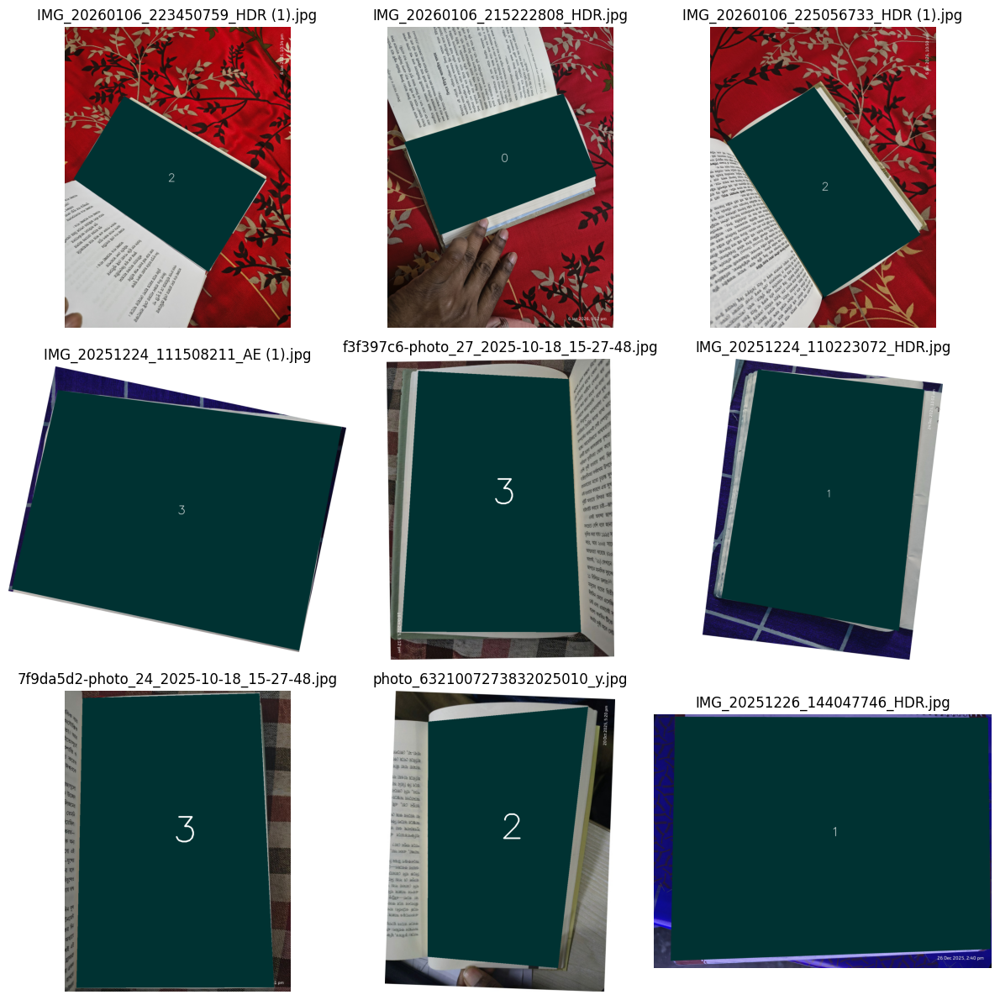

In [6]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
import math

IMAGE_DIR = "/mnt/storage1/workspace/arobin/page_orientation/data/splited_data_with_4_class/images/train"
LABEL_DIR = "/mnt/storage1/workspace/arobin/page_orientation/data/splited_data_with_4_class/labels/train"

CLASS_NAMES = ["class_0", "class_1", "class_2", "class_3"]
NUM_SAMPLES = 9
image_files = [f for f in os.listdir(IMAGE_DIR) if f.endswith((".jpg", ".png"))]
samples = random.sample(image_files, min(NUM_SAMPLES, len(image_files)))

cols = int(math.ceil(math.sqrt(len(samples))))
rows = int(math.ceil(len(samples) / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = np.array(axes).reshape(-1)

for ax, img_name in zip(axes, samples):
    img_path = os.path.join(IMAGE_DIR, img_name)
    label_path = os.path.join(LABEL_DIR, img_name.replace(".jpg", ".txt"))

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    if os.path.exists(label_path):
        with open(label_path) as f:
            for line in f:
                parts = list(map(float, line.split()))
                cls = int(parts[0])
                points = np.array(parts[1:]).reshape(-1, 2)

                # Normalize → pixel
                points[:, 0] *= w
                points[:, 1] *= h
                points = points.astype(int)

                cv2.fillPoly(img, [points], color=(0, 50, 50))
                cx, cy = points.mean(axis=0).astype(int)

                cv2.putText(
                    img,
                    str(cls),
                    (cx, cy),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    5,
                    (255, 255, 255),
                    5,
                )

    ax.imshow(img)
    ax.set_title(img_name)
    ax.axis("off")

for i in range(len(samples), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()


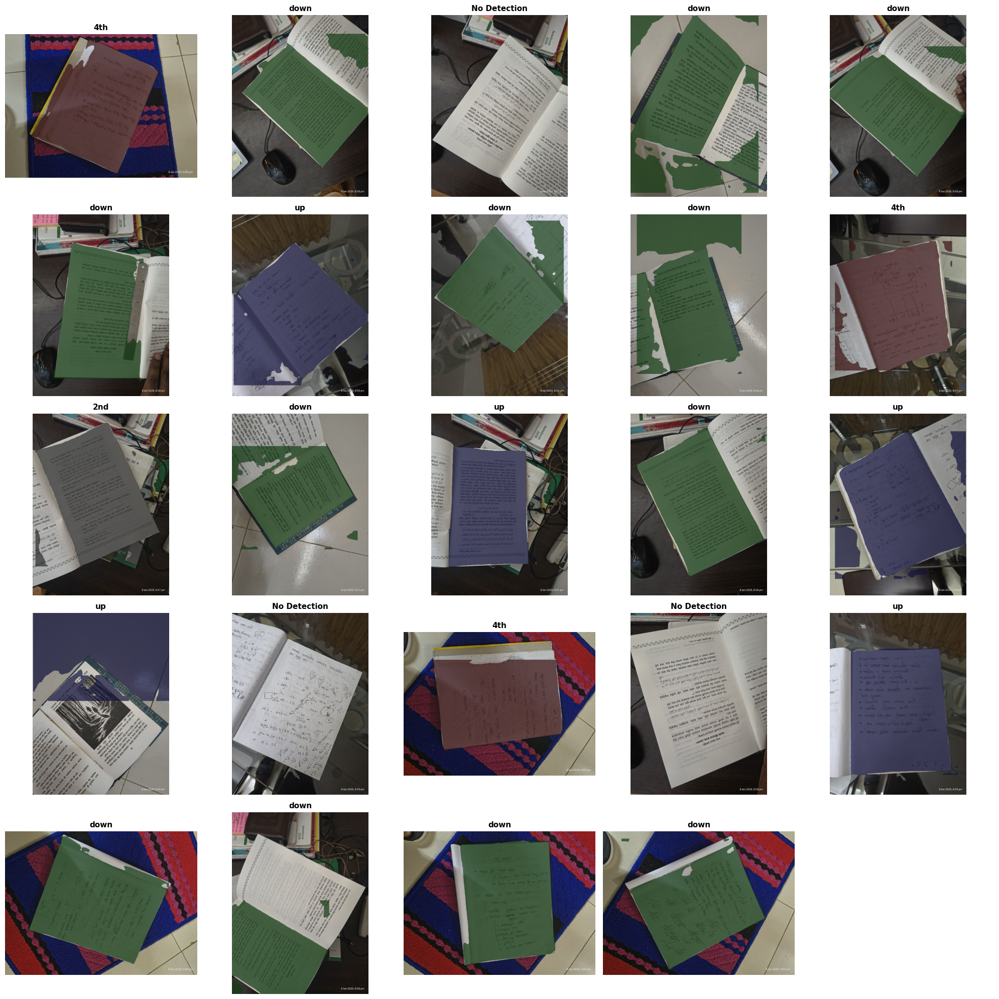

In [2]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import math

# ---------------- CONFIG ----------------
model_path = "/mnt/storage1/workspace/arobin/page_orientation/models/seg_8s_v2.pt"
image_dir = "/mnt/storage1/workspace/arobin/page_orientation/test_img"
conf_thres = 0.15

CLASS_NAMES = ["2nd", "4th", "down", "up"]

DARK_COLORS = [
    (45, 45, 45),
    (60, 20, 20),
    (20, 60, 20),
    (20, 20, 60),
    (70, 50, 20),
    (50, 20, 50),
    (20, 50, 50),
]
# ----------------------------------------

model = YOLO(model_path)

image_files = [
    f for f in os.listdir(image_dir)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

cols = int(math.ceil(math.sqrt(len(image_files))))
rows = int(math.ceil(len(image_files) / cols))

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = np.array(axes).reshape(-1)

for ax, img_name in zip(axes, image_files):
    img = cv2.imread(os.path.join(image_dir, img_name))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img_rgb.copy()

    results = model.predict(img_rgb, conf=conf_thres, verbose=False)

    best_mask = None
    best_cls = None
    max_area = 0

    # store largest mask per class
    largest_mask_per_class = {}

    for r in results:
        if r.masks is None:
            continue

        masks = r.masks.data.cpu().numpy()
        classes = r.boxes.cls.cpu().numpy().astype(int)

        for mask, cls_id in zip(masks, classes):
            mask = cv2.resize(mask, (overlay.shape[1], overlay.shape[0])) > 0.5
            area = mask.sum()

            # keep only the largest mask for each class
            if cls_id not in largest_mask_per_class:
                largest_mask_per_class[cls_id] = (area, mask)
            else:
                if area > largest_mask_per_class[cls_id][0]:
                    largest_mask_per_class[cls_id] = (area, mask)

    # now select the dominant class by area
    for cls_id, (area, mask) in largest_mask_per_class.items():
        if area > max_area:
            max_area = area
            best_cls = cls_id
            best_mask = mask


    # Draw ONLY the largest mask
    if best_mask is not None:
        color = DARK_COLORS[best_cls % len(DARK_COLORS)]
        overlay[best_mask] = (
            0.3 * overlay[best_mask] + 0.7 * np.array(color)
        ).astype(np.uint8)

        title = CLASS_NAMES[best_cls]
    else:
        title = "No Detection"

    ax.imshow(overlay)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.axis("off")

# Hide unused subplots
for i in range(len(image_files), len(axes)):
    axes[i].axis("off")

plt.tight_layout()
plt.show()


In [23]:
import os
import cv2
import torch
import numpy as np
from torchvision.models.segmentation import deeplabv3_mobilenet_v3_large

# ---------------- CONFIG ----------------
IMG_DIR = "/mnt/storage1/workspace/arobin/page_orientation/test_img"  # folder of images or single image
SAVE_DIR = "/mnt/storage1/workspace/arobin/page_orientation/temp_output"
MODEL_PATH = "/mnt/storage1/workspace/arobin/bangla_printed_ocr/bangla_ocr/page_orientation/using_deeplabv3/models/deeplab_mobilenetv3_best.pth"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 2
IMG_SIZE = 512  # resize images to 512x512

os.makedirs(SAVE_DIR, exist_ok=True)

# define model
model = deeplabv3_mobilenet_v3_large(weights=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, 1)
model = model.to(DEVICE)

# load state_dict safely (ignore aux_classifier keys)
state_dict = torch.load(MODEL_PATH, map_location=DEVICE)
state_dict = {k: v for k, v in state_dict.items() if "aux_classifier" not in k}  # remove aux
model.load_state_dict(state_dict, strict=False)

model.eval()
# ---------------- INFERENCE FUNCTION ----------------
def predict_mask(img_path):
    img_name = os.path.basename(img_path)
    
    # Read and preprocess
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE)) / 255.0

    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img_norm = (img_resized - mean) / std
    tensor = torch.tensor(img_norm).permute(2,0,1).unsqueeze(0).float().to(DEVICE)

    # Predict
    with torch.no_grad():
        out = model(tensor)["out"]
        mask = torch.argmax(out, dim=1).squeeze().cpu().numpy().astype(np.uint8)

    # Resize back to original size
    mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
    
    # Save mask
    save_path = os.path.join(SAVE_DIR, img_name.replace(".jpg", ".png"))
    cv2.imwrite(save_path, mask*255)  # optional: multiply by 255 for visualization
    print(f"Saved: {save_path}")
    return mask

# ---------------- RUN INFERENCE ----------------
if os.path.isfile(IMG_DIR):
    # single image
    predict_mask(IMG_DIR)
else:
    # folder of images
    for img_file in os.listdir(IMG_DIR):
        if img_file.lower().endswith((".jpg", ".png")):
            predict_mask(os.path.join(IMG_DIR, img_file))


Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_4_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_13_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_18_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_21_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_14_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_17_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_6_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_8_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_24_2026-01-08_21-02-28.png
Saved: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_7_2026-01-08_21-02-28.png
Save

In [3]:
def apply_perspective_correction(image, box):
    """
    Warps the image so that the area within 'box' becomes a flat, 
    upright rectangular image.
    """
    # 1. Order the points: [top-left, top-right, bottom-right, bottom-left]
    # We sort them to ensure the transformation doesn't flip or twist the image.
    rect = np.zeros((4, 2), dtype="float32")
    
    # sum of coordinates: top-left has smallest sum, bottom-right has largest
    s = box.sum(axis=1)
    rect[0] = box[np.argmin(s)]
    rect[2] = box[np.argmax(s)]
    
    # difference of coordinates: top-right has smallest diff, bottom-left has largest
    diff = np.diff(box, axis=1)
    rect[1] = box[np.argmin(diff)]
    rect[3] = box[np.argmax(diff)]

    (tl, tr, br, bl) = rect

    # 2. Calculate the width of the new image
    width_top = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    width_bottom = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    max_width = max(int(width_top), int(width_bottom))

    # 3. Calculate the height of the new image
    height_left = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    height_right = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    max_height = max(int(height_left), int(height_right))

    # 4. Construct the destination points for the "flat" view
    dst = np.array([
        [0, 0],
        [max_width - 1, 0],
        [max_width - 1, max_height - 1],
        [0, max_height - 1]], dtype="float32")

    # 5. Calculate the Perspective Transform matrix and warp the image
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (max_width, max_height))

    return warped

In [4]:
import cv2
import numpy as np

def fill_and_split_mask(mask):
    # Ensure mask is binary (0 or 255)
    mask = (mask > 0).astype(np.uint8) * 255
    
    # 1. Fill holes (Closing)
    # This will fill that small black gap in the top portion
    kernel = np.ones((5, 5), np.uint8)
    filled_mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # 2. Distance Transform
    # Finds the "center of mass" for the two connected blobs
    dist_transform = cv2.distanceTransform(filled_mask, cv2.DIST_L2, 5)
    
    # 3. Threshold to find the "seeds" (the cores of the 2 regions)
    # Adjust 0.5 to a higher value if they are still connected
    ret, last_seeds = cv2.threshold(dist_transform, 0.5 * dist_transform.max(), 255, 0)
    last_seeds = np.uint8(last_seeds)

    # 4. Label the seeds
    num_labels, markers = cv2.connectedComponents(last_seeds)

    # Add 1 to all labels so background is 1 instead of 0
    # Then mark the unknown regions (the area we want to split) as 0
    markers = markers + 1
    unknown = cv2.subtract(filled_mask, last_seeds)
    markers[unknown == 255] = 0

    # 5. Apply Watershed
    # We need a 3-channel image for Watershed
    img_color = cv2.cvtColor(filled_mask, cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(img_color, markers)
    
    # markers now contains: 
    # -1 for the split boundary, 2 for the first part, 3 for the second part
    
    # Create two separate masks
    part1 = np.zeros_like(mask)
    part2 = np.zeros_like(mask)
    
    part1[markers == 2] = 255
    part2[markers == 3] = 255


    # Calculate area (number of white pixels)
    area1 = np.sum(part1 > 0)
    area2 = np.sum(part2 > 0)

    # The "Final" mask is the larger of the two
    final_mask = part1 if area1 > area2 else part2
    
    return part1, part2, final_mask





In [ ]:
import os
import cv2
import torch
import numpy as np
from torchvision.models.segmentation import deeplabv3_mobilenet_v3_large

# ---------------- CONFIG ----------------
IMG_DIR = "/mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_7_2026-01-08_21-02-28_corrected_corrected.jpg"
SAVE_DIR = "/mnt/storage1/workspace/arobin/page_orientation/temp_output"
MODEL_PATH = "/mnt/storage1/workspace/arobin/page_orientation/models/deeplab_mobilenetv3_best.pth"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_CLASSES = 2
IMG_SIZE = 512

os.makedirs(SAVE_DIR, exist_ok=True)

# ---------------- HELPER FUNCTION: GET LARGEST COMPONENT ----------------
def get_largest_component(mask):
    """
    Finds the largest connected component in a binary mask.
    Returns a mask containing only the largest region.
    """
    # Ensure mask is 8-bit single channel
    mask = mask.astype(np.uint8)
    
    # Find all connected components
    # num_labels: total number of components (including background)
    # labels: a map where each pixel has the ID of its component
    # stats: statistics including the area of each component
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    # If only background is found, return the original mask
    if num_labels <= 1:
        return mask

    # stats[label, cv2.CC_STAT_AREA] contains the area in pixels.
    # We skip the first row (label 0) because it's the background.
    areas = stats[1:, cv2.CC_STAT_AREA]
    
    # Find the index of the largest area
    # We add 1 because we sliced the stats from index 1 onwards
    largest_label = np.argmax(areas) + 1

    # Create a new mask containing only the largest component
    largest_mask = np.zeros_like(mask)
    largest_mask[labels == largest_label] = 1
    
    return largest_mask

# ---------------- LOAD MODEL ----------------
model = deeplabv3_mobilenet_v3_large(weights=None)
model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, 1)
model = model.to(DEVICE)

state_dict = torch.load(MODEL_PATH, map_location=DEVICE)
state_dict = {k: v for k, v in state_dict.items() if "aux_classifier" not in k}
model.load_state_dict(state_dict, strict=False)
model.eval()

def enhance_image(img):
    # 1. Convert to LAB color space to process Luminance only (prevents color distortion)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    # 2. Apply CLAHE to the L-channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe.apply(l)

    # 3. Merge back and convert to BGR
    enhanced_img = cv2.merge((l, a, b))
    enhanced_img = cv2.cvtColor(enhanced_img, cv2.COLOR_LAB2BGR)

    # 4. Edge-preserving smoothing
    # d=9: pixel neighborhood, 75: color sigma, 75: space sigma
    enhanced_img = cv2.bilateralFilter(enhanced_img, 9, 75, 75)

    return enhanced_img



def get_regular_rectangular_mask(mask, scale_factor=0.95):
    """
    Fits a rotated rectangle and clips any out-of-bounds corners 
    directly to the image edges.
    """
    mask = mask.astype(np.uint8)
    h, w = mask.shape[:2]
    
    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return mask, None

    # Get the largest contour
    cnt = max(contours, key=cv2.contourArea)
    
    # Calculate the minimum area rotated rectangle
    rect = cv2.minAreaRect(cnt)
    (center_x, center_y), (width, height), angle = rect
    
    # Apply scaling (shrinkage)
    shrunk_rect = ((center_x, center_y), (width * scale_factor, height * scale_factor), angle)
    
    # Get 4 corner points
    box = cv2.boxPoints(shrunk_rect)
    
    # --- Edge Clipping Logic ---
    # np.clip(array, min_value, max_value)
    # We clip X coordinates between 0 and w-1
    # We clip Y coordinates between 0 and h-1
    clipped_box = np.zeros_like(box)
    clipped_box[:, 0] = np.clip(box[:, 0], 0, w - 1)
    clipped_box[:, 1] = np.clip(box[:, 1], 0, h - 1)

    # Convert to integer coordinates for drawing/filling
    final_box = clipped_box.astype(np.int64)

    # Create mask and fill the poly
    rect_mask = np.zeros_like(mask)
    cv2.fillPoly(rect_mask, [final_box], 1)
    
    return rect_mask, final_box

# ---------------- INFERENCE FUNCTION ----------------
def predict_mask(img_path):
    img_name = os.path.basename(img_path)
    
    # Read and preprocess
    img = cv2.imread(img_path)
    if img is None: return
    img = enhance_image(img)
    h, w = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE)) / 255.0

    mean = np.array([0.485, 0.456, 0.406])
    std  = np.array([0.229, 0.224, 0.225])
    img_norm = (img_resized - mean) / std
    tensor = torch.tensor(img_norm).permute(2,0,1).unsqueeze(0).float().to(DEVICE)

    # Predict
    with torch.no_grad():
        out = model(tensor)["out"]
        mask = torch.argmax(out, dim=1).squeeze().cpu().numpy().astype(np.uint8)

    # 1. Resize back to original size first (for better precision in component analysis)
    mask = cv2.resize(mask, (w, h), interpolation=cv2.INTER_NEAREST)
    
    # 2. Extract only the largest segmented region
    largest_mask = get_largest_component(mask)
    p1, p2, final_mask = fill_and_split_mask(largest_mask)

    filtered_mask, box = get_regular_rectangular_mask(final_mask)

    # 2. Apply the correction to the original high-res image
    if box is not None:
        corrected_page = apply_perspective_correction(img, box)

        # Save the flattened result
        save_path_rect = os.path.join(SAVE_DIR, img_name.replace(".jpg", "_corrected.jpg"))
        cv2.imwrite(save_path_rect, corrected_page)
        print(f"Saved corrected page: {save_path_rect}")

    if box is not None:
        # Draw the bounding box on a copy of the original image
        # (0, 255, 0) is Green in BGR; thickness=3
        cv2.drawContours(img, [box], 0, (0, 255, 0), 3)

    # Save the original image with the drawn bbox
    save_path_img = os.path.join(SAVE_DIR, img_name.replace(".jpg", "_bbox.jpg"))
    cv2.imwrite(save_path_img, img)
    
    # Save mask
    save_path = os.path.join(SAVE_DIR, img_name.replace(".jpg", ".png").replace(".png", "_largest_fil.png"))
    cv2.imwrite(save_path, filtered_mask * 255) 
    print(f"Saved largest segment: {save_path}")
    
    return filtered_mask

# ---------------- RUN INFERENCE ----------------
if __name__ == "__main__":
    if os.path.isfile(IMG_DIR):
        predict_mask(IMG_DIR)
    else:
        for img_file in os.listdir(IMG_DIR):
            if img_file.lower().endswith((".jpg", ".png", ".jpeg")):
                predict_mask(os.path.join(IMG_DIR, img_file))

Saved corrected page: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_7_2026-01-08_21-02-28_corrected_corrected_corrected.jpg
Saved largest segment: /mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_7_2026-01-08_21-02-28_corrected_corrected_largest_fil.png


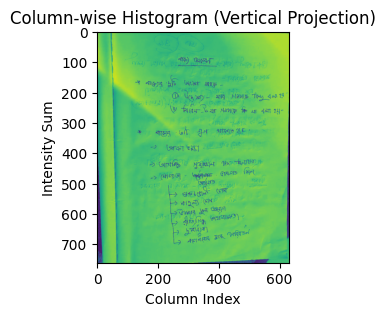

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img_p = r"/mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_1_2026-01-08_21-02-28_corrected.jpg"
# Read image
img = cv2.imread(img_p, cv2.IMREAD_GRAYSCALE)
plt.figure(figsize=(12,3))
plt.imshow(img)
plt.title("Column-wise Histogram (Vertical Projection)")
plt.xlabel("Column Index")
plt.ylabel("Intensity Sum")
plt.show()

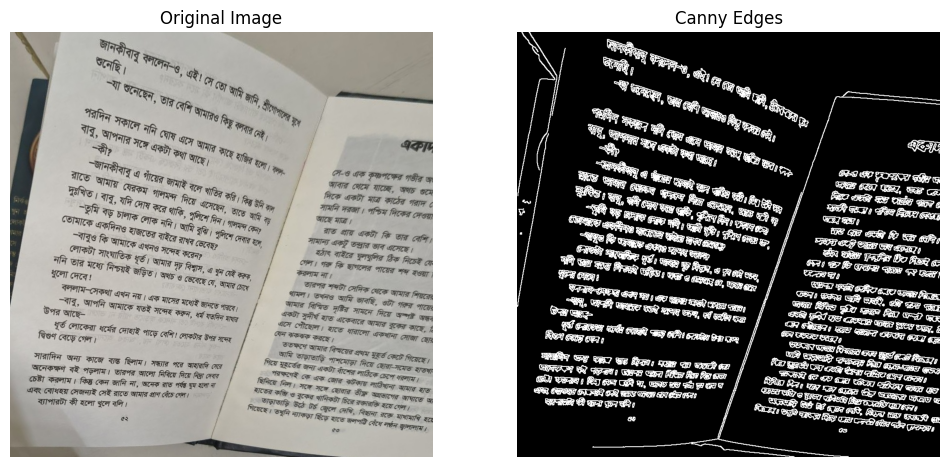

In [108]:
import cv2
import numpy as np
from scipy.signal import savgol_filter
# 1. Load the image
image = cv2.imread('/mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_21_2026-01-08_21-02-28_corrected.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 2. Blur the image to reduce noise
# This helps the edge detector focus on text rather than paper grain
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 3. Apply Canny Edge Detection
# Adjust 50 and 150 (thresholds) depending on your image contrast
edges = cv2.Canny(blurred, 50, 150)

# 4. Optional: Dilate the edges to make them more visible
kernel = np.ones((2,2), np.uint8)
dilated_edges = cv2.dilate(edges, kernel, iterations=1)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(dilated_edges, cmap='gray')
plt.title("Canny Edges")
plt.axis("off")
plt.show()


In [109]:

# # 2. Invert and Binarize (Text should be white, background black)
# # Using OTSU thresholding to handle different lighting
# _, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# # 3. Apply Dilation
# # We use a small rectangular kernel to "expand" the white text pixels
# kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))
# dilated = cv2.dilate(thresh, kernel, iterations=3)

# plt.imshow(dilated)

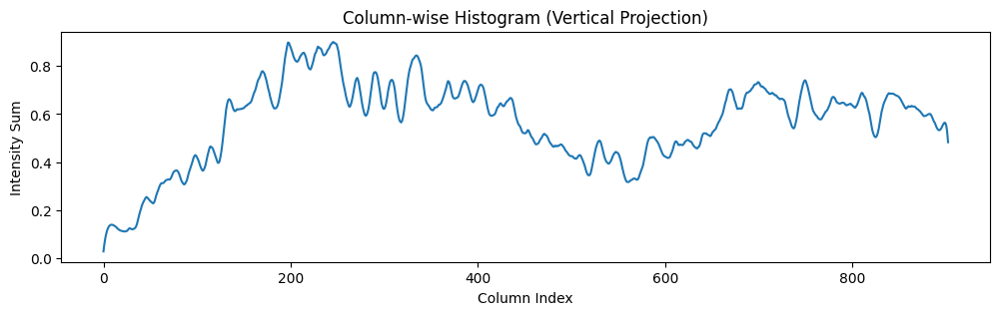

In [110]:

dilated = dilated_edges

# Column-wise histogram (vertical projection)
col_hist = np.sum(dilated, axis=0)

# Normalize (optional)
col_hist = col_hist / col_hist.max()
col_hist = savgol_filter(col_hist, window_length=30, polyorder=5)
# Plot
plt.figure(figsize=(12,3))
plt.plot((col_hist))
plt.title("Column-wise Histogram (Vertical Projection)")
plt.xlabel("Column Index")
plt.ylabel("Intensity Sum")
plt.show()


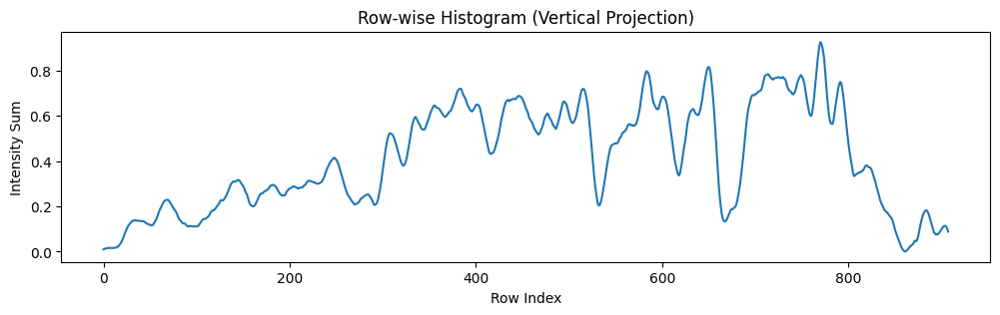

In [111]:
import cv2
import numpy as np
import matplotlib.pyplot as plt



# Column-wise histogram (vertical projection)
row_hist = np.sum(dilated, axis=1)

# Normalize (optional)
row_hist = row_hist / row_hist.max()
row_hist = savgol_filter(row_hist, window_length=30, polyorder=5)    
# Plot
plt.figure(figsize=(12,3))
plt.plot((row_hist))
plt.title("Row-wise Histogram (Vertical Projection)")
plt.xlabel("Row Index")
plt.ylabel("Intensity Sum")
plt.show()


In [112]:
import numpy as np
from scipy.signal import find_peaks

def get_structural_score(profile):
    """
    Focuses on the depth of valleys and the range of the signal
    to distinguish structured text alignment from noise.
    """
    # 1. Normalize
    norm = (profile - np.min(profile)) / (np.ptp(profile) + 1e-6)
    
    # 2. Dynamic Peak Detection 
    # We use a high prominence to ignore the "jitter" in the noisy plots.
    # A prominence of 0.3 means the peak must rise 30% above its base.
    peaks, props = find_peaks(norm, prominence=0.3)
    num_peaks = len(peaks)
    
    # 3. Calculate "Valley Depth"
    # The noisy plot stays high (near 1.0). The structured plot hits the floor (near 0.0).
    # We measure how much of the signal is actually "Low"
    low_regions = np.sum(norm < 0.3) / len(norm)
    
    # 4. Signal Swing (Standard Deviation of the Normalized Signal)
    # Structured plots have high SD because they swing between 0 and 1.
    # Noisy plots have low SD because they stay bunched up at the top.
    swing = np.std(norm)
    
    # Final Score: 
    # High number of LARGE peaks * the amount of "floor" time * the swing
    score = num_peaks * low_regions * swing
    
    return score, peaks

def identify_correct_plot(plot1, plot2):
    score1, peaks1 = get_structural_score(plot1)
    score2, peaks2 = get_structural_score(plot2)
    
    print(f"Plot 1 Score: {score1:.4f} (Swing & Depth)")
    print(f"Plot 2 Score: {score2:.4f} (Swing & Depth)")

    if score1 > score2:
        return 1, peaks1
    else:
        return 2, peaks2

# Execute
best_idx, best_peaks = identify_correct_plot(col_hist, row_hist)

Plot 1 Score: 0.0260 (Swing & Depth)
Plot 2 Score: 0.4352 (Swing & Depth)


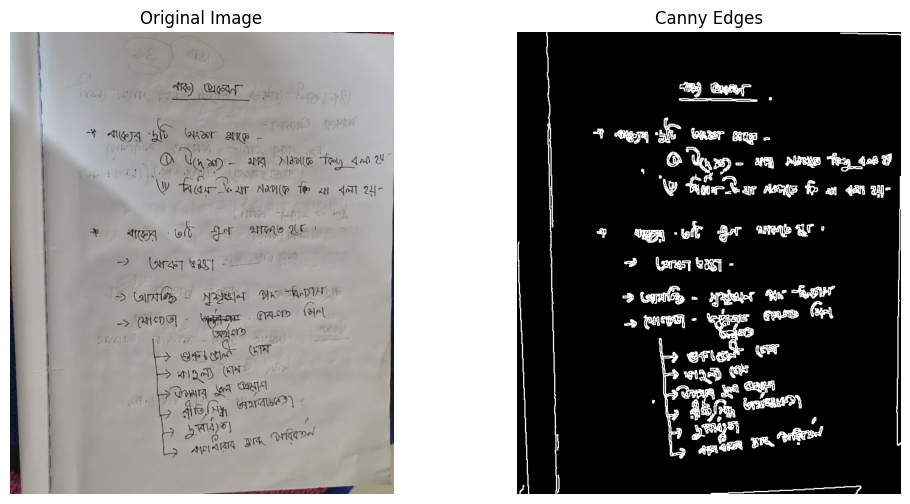

In [113]:
import cv2
import numpy as np

# 1. Load the image
image = cv2.imread('/mnt/storage1/workspace/arobin/page_orientation/temp_output/photo_1_2026-01-08_21-02-28_corrected.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 2. Blur the image to reduce noise
# This helps the edge detector focus on text rather than paper grain
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# 3. Apply Canny Edge Detection
# Adjust 50 and 150 (thresholds) depending on your image contrast
edges = cv2.Canny(blurred, 50, 150)

# 4. Optional: Dilate the edges to make them more visible
kernel = np.ones((2,2), np.uint8)
dilated_edges = cv2.dilate(edges, kernel, iterations=1)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis("off")
plt.subplot(1,2,2)
plt.imshow(dilated_edges, cmap='gray')
plt.title("Canny Edges")
plt.axis("off")
plt.show()


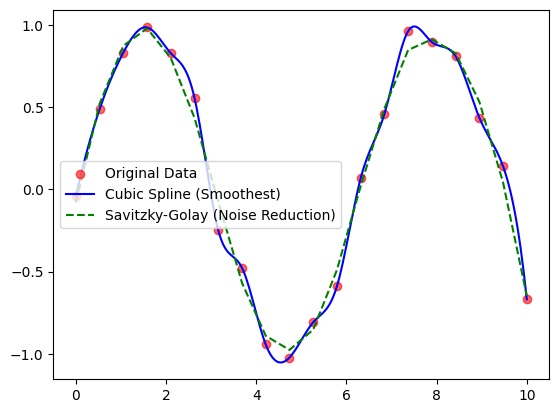

In [114]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
from scipy.signal import savgol_filter

# 1. Your data (Example: 20 noisy points)
x = np.linspace(0, 10, 20)
y = np.sin(x) + np.random.normal(0, 0.1, len(x))

# 2. Method: Cubic Spline Interpolation
# We create 300 points for a "perfectly" smooth look
x_smooth = np.linspace(x.min(), x.max(), 300) 
spline = make_interp_spline(x, y, k=3)
y_spline = spline(x_smooth)

# 3. Method: Savitzky-Golay Filter
# window_length must be odd. polyorder is the degree of polynomial.
y_savgol = savgol_filter(y, window_length=7, polyorder=2)

# Visualization
plt.scatter(x, y, color='red', label='Original Data', alpha=0.6)
plt.plot(x_smooth, y_spline, label='Cubic Spline (Smoothest)', color='blue')
plt.plot(x, y_savgol, label='Savitzky-Golay (Noise Reduction)', color='green', linestyle='--')
plt.legend()
plt.show()